In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import contextily as cx

from esda import Moran

import libpysal.weights as lbs
import matplotlib.pyplot as plt

In [2]:
lsoas = gpd.read_file("lsoas.geojson")

In [3]:
lsoas.head()

,OBJECTID,LSOA11CD,LSOA11NM,LSOA11NMW,BNG_E,BNG_N,LONG,LAT,Shape__Area,Shape__Length,geometry
0,1,E01000001,City of London 001A,City of London 001A,532129,181625,-0.097060,51.51810,133324.978691,2291.187925,"POLYGON ((-0.09726 51.52158, -0.09649 51.52028..."
1,2,E01000002,City of London 001B,City of London 001B,532480,181699,-0.091970,51.51868,226210.015953,2488.086900,"POLYGON ((-0.08967 51.52069, -0.08992 51.51998..."
2,3,E01000003,City of London 001C,City of London 001C,532245,182036,-0.095230,51.52176,57285.328705,1142.242230,"POLYGON ((-0.09676 51.52325, -0.09644 51.52282..."
3,4,E01000005,City of London 001E,City of London 001E,533581,181265,-0.076280,51.51452,190747.438499,2167.872156,"POLYGON ((-0.07320 51.51000, -0.07551 51.50974..."
4,5,E01000006,Barking and Dagenham 016A,Barking and Dagenham 016A,544994,184276,0.089318,51.53876,144195.364548,1935.412725,"POLYGON ((0.09118 51.53909, 0.09328 51.53787, ..."


In [72]:
population = pd.read_csv("https://assets.publishing.service.gov.uk/government/uploads/system/uploads/attachment_data/file/845345/File_7_-_All_IoD2019_Scores__Ranks__Deciles_and_Population_Denominators_3.csv")
population = population[['LSOA code (2011)', 'Income Score (rate)', 'Total population: mid 2015 (excluding prisoners)']]
population = population.set_axis(['LSOA11CD', 'income_deprivation', 'population'], axis=1, inplace=False)

In [6]:
lsoas = lsoas.to_crs("epsg:27700")
lsoas['area'] = lsoas.geometry.area

In [7]:
lsoas = lsoas[['LSOA11CD', 'LSOA11NM', 'area', 'geometry']]

In [8]:
lsoas.head()

,LSOA11CD,LSOA11NM,area,geometry
0,E01000001,City of London 001A,133325.002559,"POLYGON ((532105.104 182011.234, 532162.503 18..."
1,E01000002,City of London 001B,226210.077179,"POLYGON ((532634.509 181926.019, 532619.153 18..."
2,E01000003,City of London 001C,57285.315850,"POLYGON ((532135.151 182198.134, 532158.262 18..."
3,E01000005,City of London 001E,190747.662835,"POLYGON ((533808.030 180767.777, 533649.050 18..."
4,E01000006,Barking and Dagenham 016A,144195.451211,"POLYGON ((545122.062 184314.934, 545271.862 18..."


In [9]:
joined = lsoas.merge(population, left_on='LSOA11CD', right_on='LSOA11CD', how='left')

In [10]:
joined['density'] = joined['population'] / joined['area'] * 10**6

In [11]:
joined.loc[joined['density']>800, 'indicator'] = 1
joined.loc[joined['density']<800, 'indicator'] = 0

In [12]:
joined.head()

,LSOA11CD,LSOA11NM,area,geometry,lsoa_code,lsoa_name,population,density,indicator
0,E01000001,City of London 001A,133325.002559,"POLYGON ((532105.104 182011.234, 532162.503 18...",E01000001,City of London 001A,1472,11040.689831,1.0
1,E01000002,City of London 001B,226210.077179,"POLYGON ((532634.509 181926.019, 532619.153 18...",E01000002,City of London 001B,1438,6356.922812,1.0
2,E01000003,City of London 001C,57285.315850,"POLYGON ((532135.151 182198.134, 532158.262 18...",E01000003,City of London 001C,1348,23531.335736,1.0
3,E01000005,City of London 001E,190747.662835,"POLYGON ((533808.030 180767.777, 533649.050 18...",E01000005,City of London 001E,987,5174.375326,1.0
4,E01000006,Barking and Dagenham 016A,144195.451211,"POLYGON ((545122.062 184314.934, 545271.862 18...",E01000006,Barking and Dagenham 016A,1731,12004.539571,1.0


In [13]:
q = lbs.Queen.from_dataframe(lsoas)

/Users/andrewrenninger/opt/anaconda3/envs/sandbox/lib/python3.9/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 8 disconnected components.
 There is 1 island with id: 18535.
  warnings.warn(message)


In [14]:
joined['neighbors'] = [i for i in q._cardinalities.values()]

In [15]:
joined = joined[joined['neighbors']!=0]

In [16]:
print(joined.shape)
print(lsoas.shape)

(34752, 10)
(34753, 4)


In [17]:
ratios = []

for i in list(joined.index):
    counter = 0
    for j in q.neighbors[i]:
        counter += joined[joined.index==j]['indicator'].iloc[0]
        
    ratios.append(counter)

In [18]:
joined['ratio'] = ratios / joined['neighbors']

In [19]:
joined.loc[joined['indicator']==1, 'is_cosmo'] = 1
joined.loc[joined['ratio']>0.6, 'is_cosmo'] = 1
joined.loc[(joined['ratio']<0.6) & (joined['indicator']!=1), 'is_cosmo'] = 0

In [20]:
surfaces = joined[joined['is_cosmo']==1].dissolve()
surfaces = surfaces.geometry.iloc[0]
surfaces = list(surfaces)

/var/folders/br/d_fg9g853bq1_bt73prjp3pr0000gn/T/ipykernel_53695/3894085810.py:3: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  surfaces = list(surfaces)
/var/folders/br/d_fg9g853bq1_bt73prjp3pr0000gn/T/ipykernel_53695/3894085810.py:3: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  surfaces = list(surfaces)


In [21]:
from shapely.geometry import Polygon
surfaces = [Polygon(i.exterior.coords) for i in surfaces]

In [22]:
surfaces = gpd.GeoDataFrame(geometry=gpd.GeoSeries(surfaces, crs='epsg:27700'))

In [23]:
surfaces['id'] = range(len(surfaces))
surfaces.explore('id')

In [24]:
background = joined.dissolve()

In [25]:
%%time

import warnings
warnings.simplefilter("ignore")

iterations = list()

for t in np.arange(800, 3300, 100):
    print(t)
    
    temporary = joined
    
    temporary.loc[temporary['density']>t, 'indicator'] = 1
    temporary.loc[temporary['density']<t, 'indicator'] = 0
    
#     temporary['neighbors'] = [i for i in q._cardinalities.values()]
#     temporary = temporary[temporary['neighbors']!=0]
    
    ratios = []

    for i in list(temporary.index):
        counter = 0
        for j in q.neighbors[i]:
            counter += temporary[temporary.index==j]['indicator'].iloc[0]
        
        ratios.append(counter)
    
    temporary['ratio'] = ratios / temporary['neighbors']
    
    temporary.loc[temporary['indicator']==1, 'is_cosmo'] = 1
    temporary.loc[temporary['ratio']>0.6, 'is_cosmo'] = 1
    temporary.loc[(temporary['ratio']<0.6) & (temporary['indicator']!=1), 'is_cosmo'] = 0
    
    surfaces = temporary[temporary['is_cosmo']==1].dissolve()
    surfaces = surfaces.geometry.iloc[0]
    surfaces = list(surfaces)
    
    surfaces = [Polygon(i.exterior.coords) for i in surfaces]
    surfaces = gpd.GeoDataFrame(geometry=gpd.GeoSeries(surfaces, crs='epsg:27700'))
    
    surfaces['id'] = range(len(surfaces))
    surfaces['threshold'] = t
    
    iterations.append(surfaces)

800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
CPU times: user 35min 45s, sys: 1.05 s, total: 35min 46s
Wall time: 35min 49s


In [26]:
results = gpd.GeoDataFrame(pd.concat(iterations))

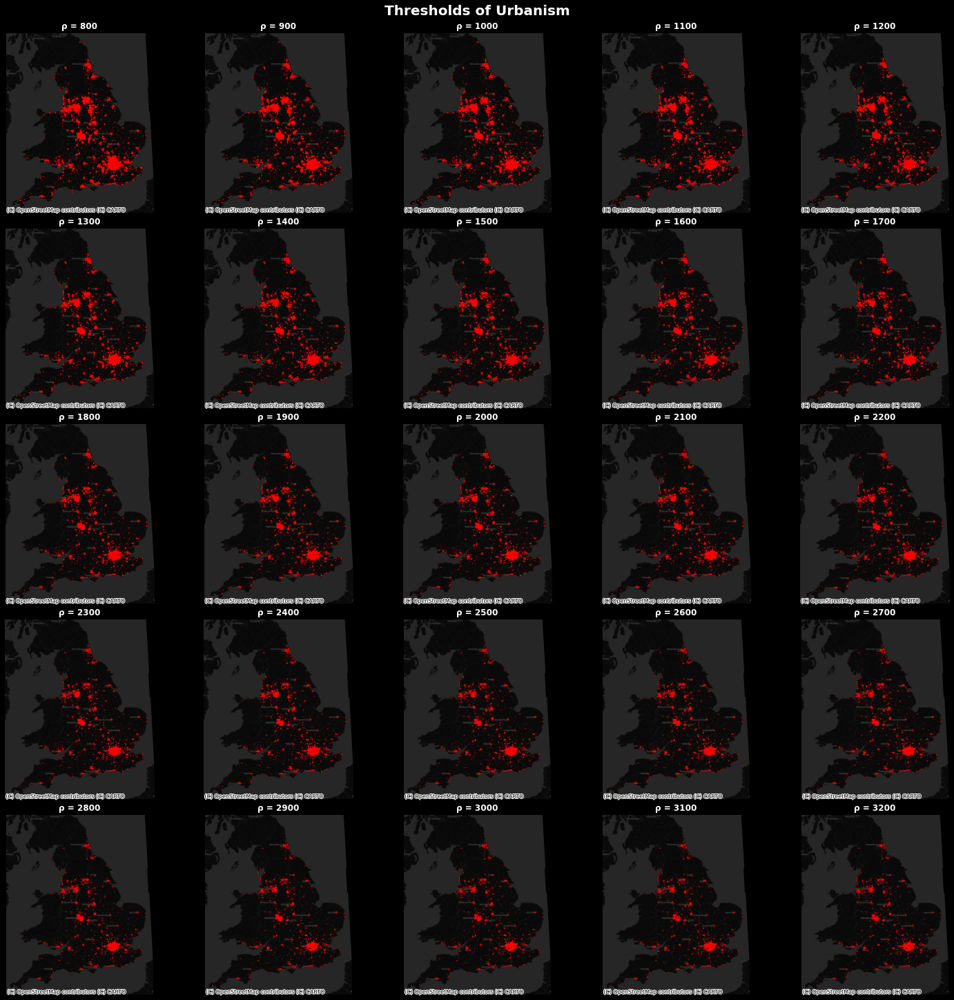

In [27]:
fig, axs = plt.subplots(5, 5, figsize=(20, 20), 
                        facecolor='k',
                        constrained_layout=True, 
                        subplot_kw=dict(aspect='equal'))

axs = axs.ravel()
thresholds = np.arange(800, 3300, 100)

for i in np.arange(0, 25):
    t = thresholds[i]
    temporary = results[results['threshold']==t]
    
    temporary.plot(ax=axs[i], color='r', lw=0.75)
    cx.add_basemap(axs[i], crs={'init': 'epsg:27700'},
                   source=cx.providers.CartoDB.DarkMatter)
    
    axs[i].set_axis_off()
    axs[i].set_title(f"ρ = {t}", color='w', weight='bold')
    axs[i].margins(0)
    
fig.suptitle('Thresholds of Urbanism', color='w', size=20, weight='bold')
fig.savefig('urban-thresholds.png', facecolor=fig.get_facecolor(), dpi=120, bbox_inches='tight')

In [47]:
expander = lambda x: gpd.sjoin(gpd.GeoDataFrame(lsoas['LSOA11CD'], geometry=lsoas.centroid, crs='epsg:27700'), 
                               gpd.GeoDataFrame(x, geometry=x.geometry, crs='epsg:27700'), 
                               how='left', predicate='intersects')

expanded = results.groupby('threshold').apply(expander)

In [48]:
expanded = expanded[['LSOA11CD', 'id', 'threshold']].merge(lsoas, left_on='LSOA11CD', right_on='LSOA11CD', how='left')
expanded = gpd.GeoDataFrame(expanded)

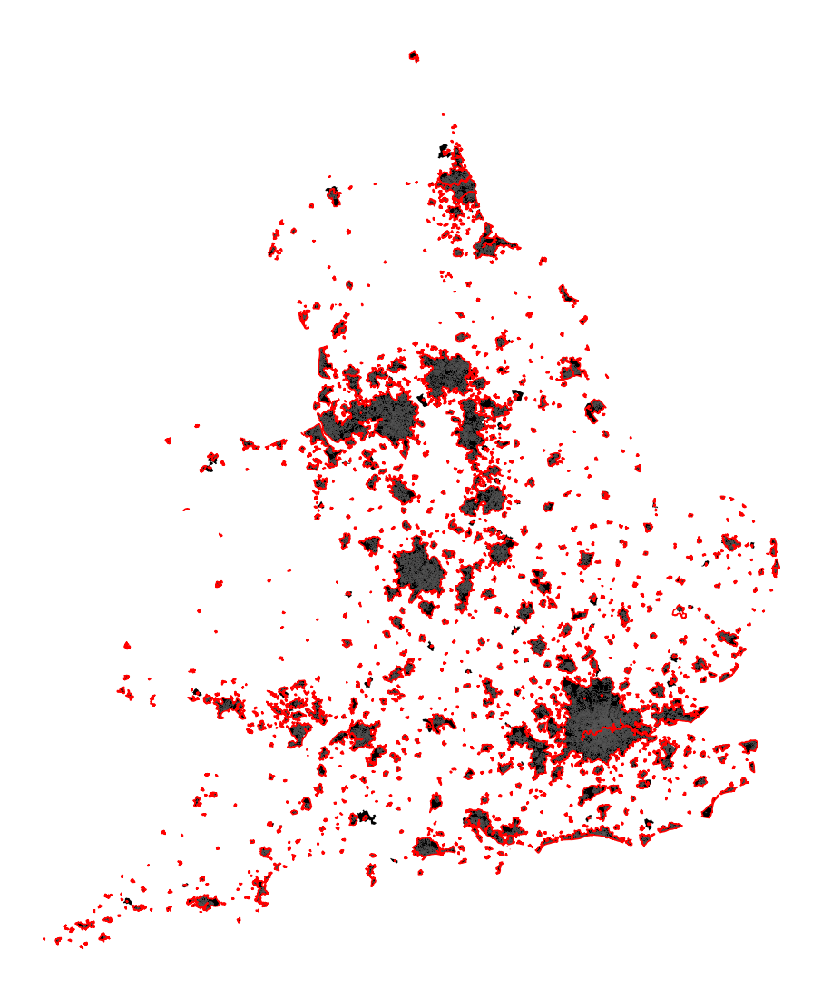

In [49]:
fig, ax = plt.subplots(1, 1, figsize=(20, 20))

expanded[expanded['threshold']==800].plot(color='k', ax=ax)
results[results['threshold']==800].boundary.plot(color='r', ax=ax)

ax.set_axis_off()

In [50]:
counts = pd.DataFrame(expanded.groupby(['id', 'threshold'], as_index=False).LSOA11CD.count())
counts = counts[counts['LSOA11CD']>10]

In [51]:
counts = counts.rename(columns={'LSOA11CD': 'count'})
counts.head()

,id,threshold,count
50,2.0,800.0,12
51,2.0,900.0,12
52,2.0,1000.0,12
71,3.0,2500.0,12
72,3.0,2600.0,12


In [52]:
expanded = expanded.merge(counts, left_on=['id', 'threshold'], right_on=['id', 'threshold'], how='left')
expanded = expanded[~expanded['count'].isnull()]

In [75]:
final = expanded.merge(population, left_on='LSOA11CD', right_on='LSOA11CD', how='left')
final = final[['LSOA11CD', 'LSOA11NM', 'threshold', 'id', 'area', 'population', 'income_deprivation', 'geometry']]

final.head()

,LSOA11CD,LSOA11NM,threshold,id,area,population,income_deprivation,geometry
0,E01000001,City of London 001A,800.0,915.0,133325.002559,1296.0,0.007,"POLYGON ((532105.104 182011.234, 532162.503 18..."
1,E01000002,City of London 001B,800.0,915.0,226210.077179,1156.0,0.034,"POLYGON ((532634.509 181926.019, 532619.153 18..."
2,E01000003,City of London 001C,800.0,915.0,57285.315850,1350.0,0.086,"POLYGON ((532135.151 182198.134, 532158.262 18..."
3,E01000005,City of London 001E,800.0,915.0,190747.662835,1121.0,0.211,"POLYGON ((533808.030 180767.777, 533649.050 18..."
4,E01000006,Barking and Dagenham 016A,800.0,915.0,144195.451211,2040.0,0.117,"POLYGON ((545122.062 184314.934, 545271.862 18..."


In [95]:
def moran_chunk(chunk):
    """Compute Moran's I for a specific local authority "chunk" of our lsoa dataframe"""
    # Find out which LSOAs are next to one another
    w = lbs.Queen.from_dataframe(chunk)
    # If a local authority has more than one LSOA:
    if w.n > 1:
        # Compute the Moran's I among its LSOAs
        mo = Moran(chunk['income_deprivation'].values, w=w)
        I,p = mo.I, mo.p_sim
    else:
        # If not, just return it as missing
        I, p = None,None
    return (I, p)

def deprived_pop_frac(chunk):
    """Compute the fraction of population that is income-deprived within a local authority"""
    # The total population of the local authority 
    total_pop = chunk['population'].sum()
    # The total income-deprived population of the local authority
    deprived_pop = (chunk['population']*chunk['income_deprivation']).sum()
    return deprived_pop / total_pop

In [170]:
rates = final.groupby(['threshold', 'id']).apply(deprived_pop_frac)

In [171]:
moran_stats = final.groupby(['threshold', 'id']).apply(moran_chunk)

('WARNING: ', 19, ' is an island (no neighbors)')
('WARNING: ', 822, ' is an island (no neighbors)')
('WARNING: ', 1, ' is an island (no neighbors)')
('WARNING: ', 101, ' is an island (no neighbors)')
('WARNING: ', 19, ' is an island (no neighbors)')
('WARNING: ', 809, ' is an island (no neighbors)')
('WARNING: ', 1, ' is an island (no neighbors)')
('WARNING: ', 28, ' is an island (no neighbors)')
('WARNING: ', 101, ' is an island (no neighbors)')
('WARNING: ', 19, ' is an island (no neighbors)')
('WARNING: ', 794, ' is an island (no neighbors)')
('WARNING: ', 1, ' is an island (no neighbors)')
('WARNING: ', 22, ' is an island (no neighbors)')
('WARNING: ', 101, ' is an island (no neighbors)')
('WARNING: ', 17, ' is an island (no neighbors)')
('WARNING: ', 9, ' is an island (no neighbors)')
('WARNING: ', 787, ' is an island (no neighbors)')
('WARNING: ', 1, ' is an island (no neighbors)')
('WARNING: ', 22, ' is an island (no neighbors)')
('WARNING: ', 101, ' is an island (no neighbors)

In [173]:
moran_stats = moran_stats.apply(pd.Series)
moran_stats.columns = ["Moran's I", 'p_value']

In [174]:
moran_stats['Significant'] = moran_stats.p_value < .01

In [175]:
moran_stats.head()

Moran's I  p_value  Significant
threshold id                                   
800.0     2.0   -0.129353    0.432        False
          5.0    0.243552    0.023        False
          8.0   -0.004724    0.386        False
          10.0   0.069807    0.197        False
          15.0   0.505197    0.001         True

In [176]:
moran_stats.reset_index()

,threshold,id,Moran's I,p_value,Significant
0,800.0,2.0,-0.129353,0.432,False
1,800.0,5.0,0.243552,0.023,False
2,800.0,8.0,-0.004724,0.386,False
3,800.0,10.0,0.069807,0.197,False
4,800.0,15.0,0.505197,0.001,True
...,...,...,...,...,...
6310,3200.0,1605.0,0.222412,0.005,True
6311,3200.0,1614.0,0.188566,0.079,False
6312,3200.0,1615.0,0.163804,0.106,False
6313,3200.0,1617.0,0.365574,0.006,True


In [177]:
rates = rates.to_frame("Population in income deprivation")

In [178]:
rates.head()

Population in income deprivation
threshold id                                    
800.0     2.0                           0.215276
          5.0                           0.124426
          8.0                           0.194061
          10.0                          0.121488
          15.0                          0.147129

In [179]:
plot_data = moran_stats.join(rates).dropna()
plot_data.head()

Moran's I  p_value  Significant  \
threshold id                                      
800.0     2.0   -0.129353    0.432        False   
          5.0    0.243552    0.023        False   
          8.0   -0.004724    0.386        False   
          10.0   0.069807    0.197        False   
          15.0   0.505197    0.001         True   

                Population in income deprivation  
threshold id                                      
800.0     2.0                           0.215276  
          5.0                           0.124426  
          8.0                           0.194061  
          10.0                          0.121488  
          15.0                          0.147129

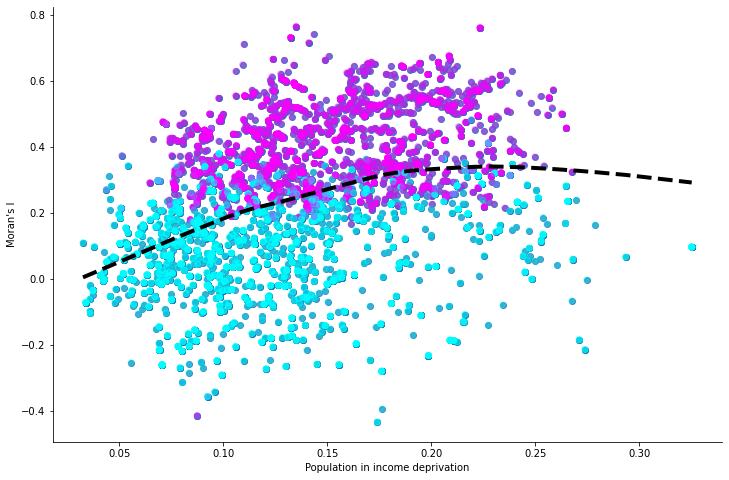

In [204]:
import seaborn as sns
fig, ax = plt.subplots(1,1,figsize=(12,8))

ax = sns.regplot(data=plot_data, 
                 x="Population in income deprivation", 
                 y="Moran's I",
                 lowess=True,
                 line_kws=dict(color='black', linewidth=4, linestyle='--'),
                 ax=ax)

ax.scatter(plot_data['Population in income deprivation'], 
           plot_data["Moran's I"],
           c=plot_data['Significant'], 
           cmap='cool',
           alpha=.3)

sns.despine(ax=ax)

plt.show()